* This notebook was made to look at hourly nowcasts salinity contours with weak/no wind condition, which could reflect how plume goes with only push by tides.

In [1]:
from __future__ import division, print_function
from salishsea_tools import (nc_tools,viz_tools,stormtools,tidetools)
from IPython.display import display, Math, Latex
from salishsea_tools.nowcast import figures
from datetime import datetime, timedelta
from pylab import *
import matplotlib.dates as mdates
import scipy.io as sio
import matplotlib.pyplot as plt
import netCDF4 as nc
import numpy as np
import math
import glob
import os
import datetime
%matplotlib inline

In [2]:
def results_dataset(period, grid, results_dir):
    """Return the results dataset for period (e.g. 1h or 1d)
    and grid (e.g. grid_T, grid_U) from results_dir.
    """
    filename_pattern = 'SalishSea_{period}_*_{grid}.nc'
    filepaths = glob(os.path.join(results_dir, filename_pattern.format(period=period, grid=grid)))
    return nc.Dataset(filepaths[0])

In [3]:
def date(year, month, day_start, day_end, period, grid):
    
    day_range = np.arange(day_start, day_end+1)
    day_len = len(day_range)
    files_all = [None] * day_len
    inds = np.arange(day_len)
    
    for i, day in zip(inds, day_range):
        run_date = datetime.datetime(year,month, day)
        results_home = '/data/dlatorne/MEOPAR/SalishSea/nowcast/'
        results_dir = os.path.join(results_home, run_date.strftime('%d%b%y').lower())
        filename = 'SalishSea_' + period + '_' + run_date.strftime('%Y%m%d').lower() + \
        '_' + run_date.strftime('%Y%m%d').lower() + '_' + grid + '.nc'
        file_single = os.path.join(results_dir, filename)
        files_all[i] = file_single

    return files_all

In [4]:
def plot_hrsalinity_contour( paths, run_date,):
    """This function was made to plot salinity contour in the specific
        region in the SoG"""
    fig, axs = plt.subplots(24, 1, figsize=(24, 160))
    z = 0 
    time_step = []
    for i in range(24):
        time_step.append(i)
    results_dir = os.path.join(paths, run_date.strftime('%d%b%y').lower())
    grid_T = results_dataset('1h','grid_T',results_dir)
    start_time = datetime.datetime(run_date.year, run_date.month, run_date.day, 0, 30)
    end_time = datetime.datetime(run_date.year, run_date.month,run_date.day, 23,30)
    numhours = (end_time - start_time).seconds //3600
    hours = [start_time + datetime.timedelta(hours=num)
             for num in range(0, numhours+1)]
    stations=['Tsawwassen','Duke','Vancouver']
    bbox_args = dict(boxstyle='square', facecolor='white', alpha=0.7)
    ferry_stations = {'Tsawwassen': {'lat': 49.0084,'lon': -123.1281},
                  'Duke': {'lat': 49.1632,'lon': -123.8909},
                  'Vancouver': {'lat': 49.2827,'lon': -123.1207}}
    
    for ax, tt, t in zip(axs, time_step, hours):
        #load variables
        latitude=grid_T.variables['nav_lat'] 
        longitude=grid_T.variables['nav_lon']
        S = grid_T.variables['vosaline']
        S =  np.ma.masked_values(S[tt, z], 0)
        #timesteps = grid_T.variables['time_counter']
        #zlevels = grid_T.variables['deptht']      
        viz_tools.set_aspect(ax, coords = 'map', lats=latitude)
        delta = 4
        cmap = plt.get_cmap('jet')
        cmap.set_bad('burlywood')
        mesh = ax.pcolormesh(longitude[:],latitude[:], S[:], cmap=cmap)
        clines = ax.contour(longitude[:], latitude[:], S[:], np.arange(0, 28, delta),
        colors='k')
        ax.clabel(clines,  inline = 1, inline_spacing =-3, fmt='%1.1f')
        #plt.clabel(CS, fontsize=9, inline=1)
        cbar = plt.colorbar(mesh, ax = ax)
        cbar.add_lines(clines)
        cbar.set_label('Pratical Salinity')
        ## plot station
        for stn in stations:
            ax.plot(ferry_stations[stn]['lon'], ferry_stations[stn]['lat'], marker='D', \
                    color='white',\
                 markersize=10, markeredgewidth=2)
        ax.annotate ('Tsawwassen',(ferry_stations['Tsawwassen']['lon'] + 0.01,\
        ferry_stations['Tsawwassen']['lat'] + 0.12), fontsize=15, color='black', bbox=bbox_args )
        ax.annotate ('Duke',(ferry_stations['Duke']['lon'] - 0.2,\
        ferry_stations['Duke']['lat'] ),fontsize=15, color='black', bbox=bbox_args )
        ax.annotate ('Vancouver',(ferry_stations['Vancouver']['lon'] + 0.06 ,\
        ferry_stations['Vancouver']['lat']+ 0.04 ),fontsize=15, color='black', bbox=bbox_args )
        ##set title and x,y limit
        ax.set_title(t.strftime('%d-%b-%Y %H:%M'))
        ax.set_xlim(-124.3, -122.5)
        ax.set_ylim(48.8, 49.4)
        ax.grid()
    return fig

In [5]:
def plot_hrsalinity_contour_more( paths, run_date,):
    """This function was made to plot salinity contour in the specific
        region in the SoG"""
    fig, axs = plt.subplots(24, 2, figsize=(26, 180))
    z1 = 0 
    z2 = 1
    time_step = []
    for i in range(24):
        time_step.append(i)
    results_dir = os.path.join(paths, run_date.strftime('%d%b%y').lower())
    grid_T = results_dataset('1h','grid_T',results_dir)
    start_time = datetime.datetime(run_date.year, run_date.month, run_date.day, 0, 30)
    end_time = datetime.datetime(run_date.year, run_date.month,run_date.day, 23,30)
    numhours = (end_time - start_time).seconds //3600
    hours = [start_time + datetime.timedelta(hours=num)
             for num in range(0, numhours+1)]
    stations=['Tsawwassen','Duke','Vancouver']
    bbox_args = dict(boxstyle='square', facecolor='white', alpha=0.7)
    ferry_stations = {'Tsawwassen': {'lat': 49.0084,'lon': -123.1281},
                  'Duke': {'lat': 49.1632,'lon': -123.8909},
                  'Vancouver': {'lat': 49.2827,'lon': -123.1207}}
    
    for ax, tt, t in zip(axs[:,0], time_step, hours):
        #load variables
        latitude=grid_T.variables['nav_lat'] 
        longitude=grid_T.variables['nav_lon']
        S = grid_T.variables['vosaline']
        S =  np.ma.masked_values(S[tt, z1], 0)
        SS = np.ma.masked_values(S[tt, z2], 0)
        #timesteps = grid_T.variables['time_counter']
        zlevels = grid_T.variables['deptht']      
        viz_tools.set_aspect(ax, coords = 'map', lats=latitude)
        delta = 4
        cmap = plt.get_cmap('jet')
        cmap.set_bad('burlywood')
        mesh = ax.pcolormesh(longitude[:],latitude[:], S[:], cmap=cmap)
        clines = ax.contour(longitude[:], latitude[:], S[:], np.arange(0, 28, delta),
        colors='k')
        ax.clabel(clines,  inline = 1, fontsize = 12,inline_spacing =-3, fmt='%1.1f')
        #plt.clabel(CS, fontsize=9, inline=1)
        cbar = plt.colorbar(mesh, ax = ax)
        cbar.add_lines(clines)
        plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='k', fontsize = 15) 
        cbar.set_label('Pratical Salinity', fontsize = 15)
        ## plot station
        for stn in stations:
            ax.plot(ferry_stations[stn]['lon'], ferry_stations[stn]['lat'], marker='D', \
                    color='white',\
                 markersize=10, markeredgewidth=2)
        ax.annotate ('Tsawwassen',(ferry_stations['Tsawwassen']['lon'] + 0.01,\
        ferry_stations['Tsawwassen']['lat'] + 0.12), fontsize=15, color='black', bbox=bbox_args )
        ax.annotate ('Duke',(ferry_stations['Duke']['lon'] - 0.2,\
        ferry_stations['Duke']['lat'] ),fontsize=15, color='black', bbox=bbox_args )
        ax.annotate ('Vancouver',(ferry_stations['Vancouver']['lon'] + 0.06 ,\
        ferry_stations['Vancouver']['lat']+ 0.04 ),fontsize=15, color='black', bbox=bbox_args )
        ##set title and x,y limit
        ax.set_title(t.strftime('%d-%b-%Y %H:%M') + ' at depth {d:.2f}'.format(d = zlevels[0]) +'m',\
                    fontsize = 15)
        ax.set_xlim(-124.3, -122.5)
        ax.set_ylim(48.8, 49.4)
        plt.setp(ax.get_xticklabels(), fontsize=15)
        plt.setp(ax.get_yticklabels(), fontsize=15)
        ax.grid()
        
    for axx, tt, t in zip(axs[:,1], time_step, hours):
        latitude=grid_T.variables['nav_lat'] 
        longitude=grid_T.variables['nav_lon']
        S = grid_T.variables['vosaline']
        SS = np.ma.masked_values(S[tt, z2], 0)
        
        viz_tools.set_aspect(axx, coords = 'map', lats=latitude)
        delta = 4
        cmap = plt.get_cmap('jet')
        cmap.set_bad('burlywood')
        meshh = axx.pcolormesh(longitude[:],latitude[:], SS[:], cmap=cmap)
        clines = axx.contour(longitude[:], latitude[:], SS[:], np.arange(0, 28, delta),
        colors='k')
        axx.clabel(clines,  inline = 1, fontsize = 12, inline_spacing =-3, fmt='%1.1f')
        #plt.clabel(CS, fontsize=9, inline=1)
        cbar = plt.colorbar(meshh, ax = axx)
        cbar.add_lines(clines)
        plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='k', fontsize = 15) 
        cbar.set_label('Pratical Salinity',fontsize = 15)
        ## plot station
        for stn in stations:
            axx.plot(ferry_stations[stn]['lon'], ferry_stations[stn]['lat'], marker='D', \
                    color='white',\
                 markersize=10, markeredgewidth=2)
        axx.annotate ('Tsawwassen',(ferry_stations['Tsawwassen']['lon'] + 0.01,\
        ferry_stations['Tsawwassen']['lat'] + 0.12), fontsize=15, color='black', bbox=bbox_args )
        axx.annotate ('Duke',(ferry_stations['Duke']['lon'] - 0.2,\
        ferry_stations['Duke']['lat'] ),fontsize=15, color='black', bbox=bbox_args )
        axx.annotate ('Vancouver',(ferry_stations['Vancouver']['lon'] + 0.06 ,\
        ferry_stations['Vancouver']['lat']+ 0.04 ),fontsize=15, color='black', bbox=bbox_args )
        axx.set_title(t.strftime('%d-%b-%Y %H:%M')+ ' at depth {d:.2f}'.format(d = zlevels[1]) +'m',\
                     fontsize = 15)
        axx.set_xlim(-124.3, -122.5)
        axx.set_ylim(48.8, 49.4)
        plt.setp(axx.get_xticklabels(), fontsize=15)
        plt.setp(axx.get_yticklabels(), fontsize=15)
        axx.grid()
    return fig

* Days with weak wind by refering to the daily nowcast result webiste are June 17, 26 and 27 during my 14 days simulation from June 16-29.

In [6]:
print ("Weak wind days information: ")
print ("Date              (mmdd)       June 17     June 26    June 27 ")
print ('wind magnitude     (m/s)        1           0.9         0.4')
print ('wind direction     (NS&WE)      SW          NW          NW')
print ('Time               (mmss)      18:30       23:30       00:30')

Weak wind days information: 
Date              (mmdd)       June 17     June 26    June 27 
wind magnitude     (m/s)        1           0.9         0.4
wind direction     (NS&WE)      SW          NW          NW
Time               (mmss)      18:30       23:30       00:30


* June 17

In [7]:
from glob import glob
run_date = datetime.datetime(2015,6,17)   
paths = '/data/dlatorne/MEOPAR/SalishSea/nowcast/'

In [8]:
print ('Ebb tides begin at 12, ends at 19 on June 17')

Ebb tides begin at 12, ends at 19 on June 17


/home/jieliu/anaconda/lib/python2.7/site-packages/matplotlib/axes/_base.py:1057: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal
  if aspect == 'normal':
/home/jieliu/anaconda/lib/python2.7/site-packages/matplotlib/axes/_base.py:1062: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal
  elif aspect in ('equal', 'auto'):
/home/jieliu/anaconda/lib/python2.7/site-packages/matplotlib/text.py:52: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal
  if rotation in ('horizontal', None):
/home/jieliu/anaconda/lib/python2.7/site-packages/matplotlib/text.py:54: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal
  elif rotation == 'vertical':


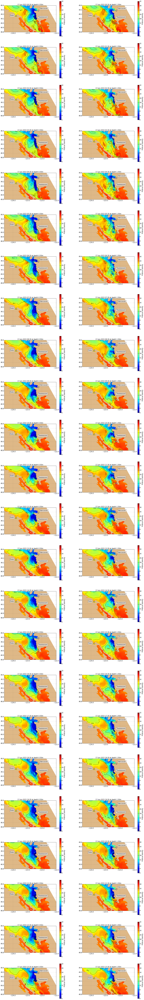

In [9]:
fig = plot_hrsalinity_contour_more(paths, run_date)

* Plume salinity below 12 units moves northward before 6 am

* June 26

In [10]:
run_date = datetime.datetime(2015,6,26)   
paths = '/data/dlatorne/MEOPAR/SalishSea/nowcast/'

In [11]:
print ('Ebb tides begin and end at 23 on June 26')

Ebb tides begin and end at 23 on June 26


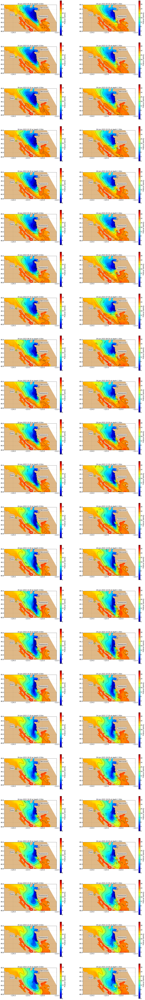

In [12]:
fig = plot_hrsalinity_contour_more(paths, run_date)

* Plume below 12 units moves southward all the time.

* June 27

In [13]:
run_date = datetime.datetime(2015,6,27)   
paths = '/data/dlatorne/MEOPAR/SalishSea/nowcast/'

In [14]:
print ('Ebb tides begin at 9, ends at 16 on June 27')

Ebb tides begin at 9, ends at 16 on June 27


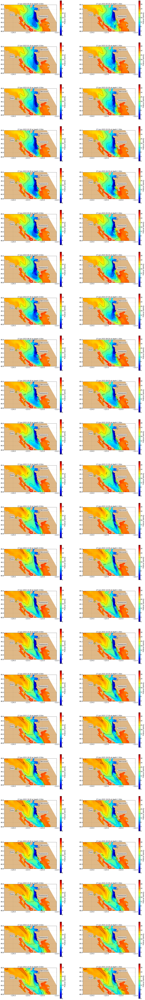

In [15]:
fig = plot_hrsalinity_contour_more(paths, run_date)

* plume below 12 units is concentrated south of Vancouver, extended further south.

* Next, double check the timing for flood and ebb tide for those days